<a href="https://colab.research.google.com/github/SalomonMalka/Black-and-white-image-colorization/blob/main/Colorization_testing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Colorization Testing 


### Imports

In [137]:
import os
import glob
import time
import numpy as np
from PIL import Image
from pathlib import Path
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from skimage.color import rgb2lab, lab2rgb
from scipy.stats import wasserstein_distance

import torch
from torch import nn, optim
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import Dataset, DataLoader

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
use_colab = None

### Import test dataset and make dataloaders

The following import 20_000 images from the COCO dataset 

In [ ]:
from fastai.data.external import untar_data, URLs
coco_path = untar_data(URLs.COCO_SAMPLE)
coco_path = str(coco_path) + "/train_sample"
use_colab = True

Next, we split it into train, validation and test. We only use the test here.

In [ ]:
if use_colab == True:
    path = coco_path
else:
    path = "/coco_dataset"
    
paths = glob.glob(path + "/*.jpg") # Grabbing all the image file names
np.random.seed(123)
paths_subset = np.random.choice(paths, 20_000, replace=False) # choosing 12_000 images randomly
rand_idxs = np.random.permutation(20_000)
train_idxs = rand_idxs[:3008] # choosing the first 8000 as training set
val_idxs = rand_idxs[3008:10_000] # choosing last 2000 as validation set
test_idxs = rand_idxs[10_000:20_000] # choosing last 2000 as test set
train_paths = paths_subset[train_idxs]
val_paths = paths_subset[val_idxs]
test_paths = paths_subset[test_idxs]
print(f"Size of train and validation set: {len(train_paths)}, {len(val_paths)}, {len(test_paths)}")


Size of train and validation set: 3008, 6992, 10000


In [ ]:
SIZE = 128
class ColorizationDataset(Dataset):
    def __init__(self, paths, split='train'):
        if split == 'train':
            self.transforms = transforms.Compose([
                transforms.Resize((SIZE, SIZE),  Image.BICUBIC),
                transforms.RandomHorizontalFlip(), # A little data augmentation!
            ])
        elif split == 'val' or split == 'test':
            self.transforms = transforms.Resize((SIZE, SIZE),  Image.BICUBIC)
        
        self.split = split
        self.size = SIZE
        self.paths = paths
    
    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert("RGB")
        img = self.transforms(img)
        img = np.array(img)
        img_lab = rgb2lab(img).astype("float32") # Converting RGB to L*a*b
        img_lab = transforms.ToTensor()(img_lab)
        L = img_lab[[0], ...] / 50. - 1. # Between -1 and 1
        color = transforms.ToTensor()(img)
        
        return {'L': L, 'color': color}
    
    def __len__(self):
        return len(self.paths)

def make_dataloaders(batch_size=16, n_workers=4, pin_memory=True, **kwargs): # A handy function to make our dataloaders
    dataset = ColorizationDataset(**kwargs)
    dataloader = DataLoader(dataset, batch_size=batch_size, num_workers=n_workers,
                            pin_memory=pin_memory)
    return dataloader

Create the test dataloader

In [ ]:
test_dl = make_dataloaders(paths=test_paths, split='test')

# print the dimention of the test
data = next(iter(test_dl))
Ls, colors = data['L'], data['color']
print("L channel image shape :", Ls.shape)
print("Color channel image shape :", colors.shape)
print(f"Lenght of test set batches: {len(test_dl)}")

L channel image shape : torch.Size([16, 1, 128, 128])
Color channel image shape : torch.Size([16, 3, 128, 128])
Lenght of test set batches: 625


### Unet architechture 

In [ ]:
class UnetBlock(nn.Module):
    def __init__(self, nf, ni, submodule=None, input_c=None, dropout=False,
                 innermost=False, outermost=False):
        super().__init__()
        self.outermost = outermost
        if input_c is None: input_c = nf
        downconv = nn.Conv2d(input_c, ni, kernel_size=4,
                             stride=2, padding=1, bias=False)
        downrelu = nn.LeakyReLU(0.2, True)
        downnorm = nn.BatchNorm2d(ni)
        uprelu = nn.ReLU(True)
        upnorm = nn.BatchNorm2d(nf)
        
        if outermost:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
                                        stride=2, padding=1)
            down = [downconv]
            up = [uprelu, upconv, nn.Tanh()]
            model = down + [submodule] + up
        elif innermost:
            upconv = nn.ConvTranspose2d(ni, nf, kernel_size=4,
                                        stride=2, padding=1, bias=False)
            down = [downrelu, downconv]
            up = [uprelu, upconv, upnorm]
            model = down + up
        else:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
                                        stride=2, padding=1, bias=False)
            down = [downrelu, downconv, downnorm]
            up = [uprelu, upconv, upnorm]
            if dropout: up += [nn.Dropout(0.5)]
            model = down + [submodule] + up
        self.model = nn.Sequential(*model)
    
    def forward(self, x):
        if self.outermost:
            return self.model(x)
        else:
            return torch.cat([x, self.model(x)], 1)

class Unet(nn.Module):
    def __init__(self, input_c=1, output_c=2, n_down=8, num_filters=64):
        super().__init__()
        unet_block = UnetBlock(num_filters * 8, num_filters * 8, innermost=True)
        for _ in range(n_down - 5):
            unet_block = UnetBlock(num_filters * 8, num_filters * 8, submodule=unet_block, dropout=True)
        out_filters = num_filters * 8
        for _ in range(3):
            unet_block = UnetBlock(out_filters // 2, out_filters, submodule=unet_block)
            out_filters //= 2
        self.model = UnetBlock(output_c, out_filters, input_c=input_c, submodule=unet_block, outermost=True)
    
    def forward(self, x):
        return self.model(x)

### Utils function

In [135]:
BATCH_SIZE = 16

def ColorizeBatch(grey_image, model):
  # input images' batch (gray) size: [BATCH_SIZE=16, 1, 128, 128]
  # 
  # output images' batch (color) size: [BATCH_SIZE=16, 3, 128, 128]
  # --------------------------------------------

  pred = model(grey_image).detach().cpu()
  return pred

def VisualizeBatch(gray_batch, model):
  color = ColorizeBatch(gray_batch, model)

  fig, axes = plt.subplots(BATCH_SIZE//2, 4, figsize = (16,32), squeeze = True)

  for i in range(BATCH_SIZE//2):
    grey_i = gray_batch[2*i][0].numpy()
    axes[i,0].imshow(np.uint8(255*(grey_i+1)/2), cmap='gray')
    axes[i,0].set_xticks([])
    axes[i,0].set_yticks([])
    axes[i,0].set_title("gray")

    color_i = color[2*i].permute(1,2,0).numpy()
    axes[i,1].imshow(np.clip(color_i,0,1))
    axes[i,1].set_xticks([])
    axes[i,1].set_yticks([])
    axes[i,1].set_title("pred")

    grey_i = gray_batch[2*i+1][0].numpy()
    axes[i,2].imshow(np.uint8(255*(grey_i+1)/2), cmap='gray')
    axes[i,2].set_xticks([])
    axes[i,2].set_yticks([])
    axes[i,2].set_title("gray")

    color_i = color[2*i+1].permute(1,2,0).numpy()
    axes[i,3].imshow(np.clip(color_i,0,1))
    axes[i,3].set_xticks([])
    axes[i,3].set_yticks([])
    axes[i,3].set_title("pred")

  plt.tight_layout()
  plt.show()

def Colorize(grey_image, model):
  # input: Tensor [1,128,128]
  # output: torch.tensor [1,128,128]
  grey_image_to_batch = torch.stack([img_tensor]*16,dim=0)
  color_image = ColorizeBatch(grey_image_to_batch, model)[[0]]

  return color_image

### Colorization of the test set

  0%|          | 0/625 [00:00<?, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:478: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


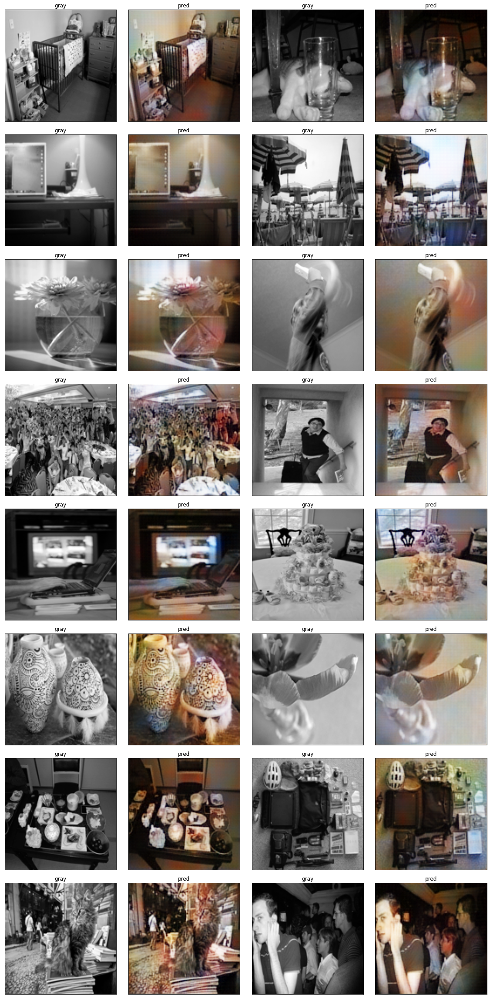

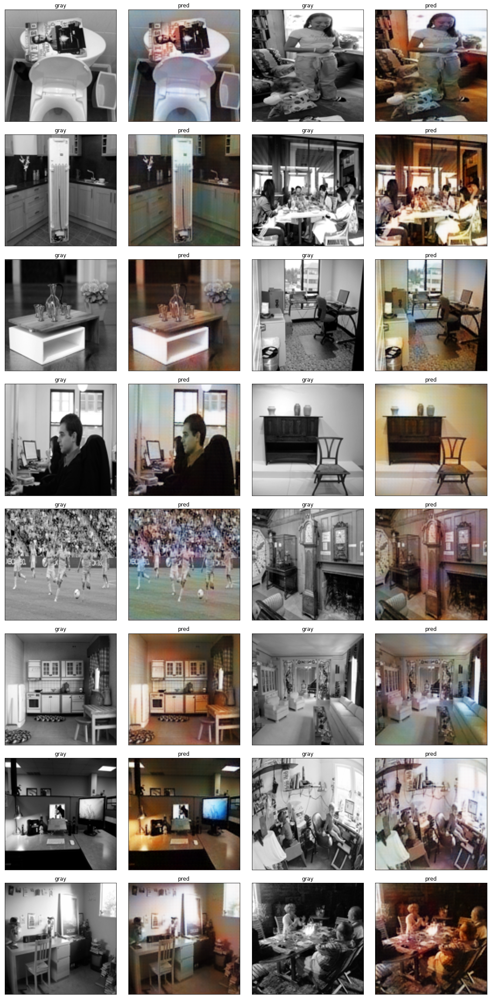

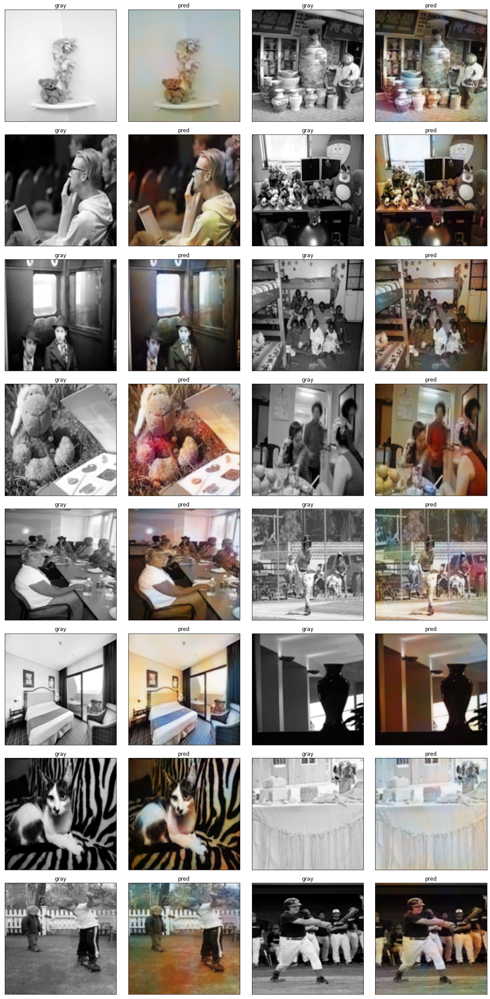

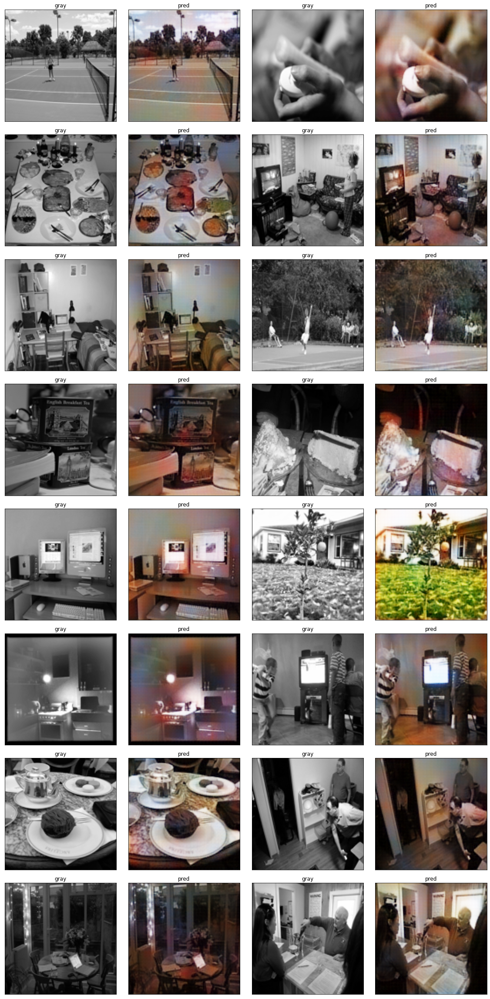

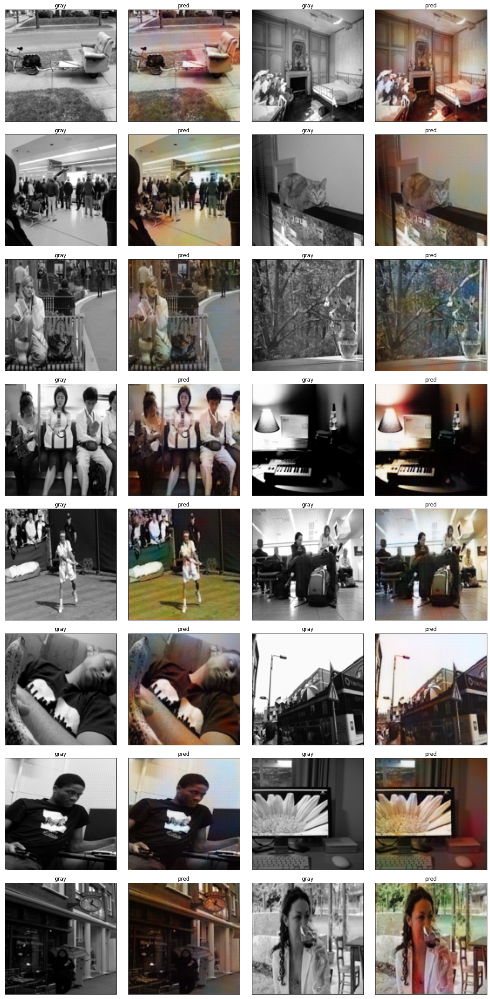

In [149]:
torch.cuda.empty_cache()
unet = Unet(input_c=1, output_c=3, n_down=4, num_filters=32)

# chose which trained parameters you want (MSE,VGG,L1,...)
trained_param_src = "MSE_Engineered_epoch50.pt"

unet.load_state_dict(torch.load(trained_param_src, map_location=device))

model = unet

counter = 0
n = 5
for data in tqdm(test_dl):
  gray, color = data['L'].to(device), data['color'].to(device)
  VisualizeBatch(gray)

  # do it for the n first batches (otherwise its too long)
  counter += 1
  if counter >= n:
    break


### Colorize your own image

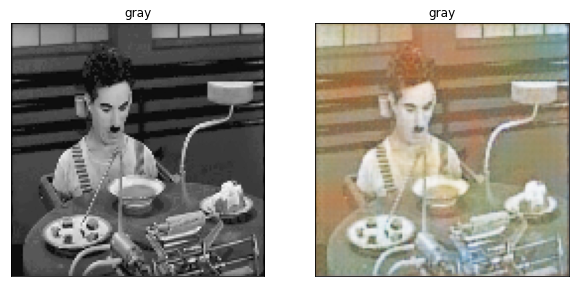

In [145]:
# Enter your image source here:
src = "charlychaplin.jpg"

# Transforms to correct network input
img = Image.open(src)
convert_tensor = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((SIZE, SIZE),  Image.BICUBIC)
    ])
img_tensor = convert_tensor(img)[[0]]

# Colorize the image
img_color = Colorize(img_tensor)

# Show the results
fig, axes = plt.subplots(1,2,figsize=(10,5))
axes[0].imshow(img_tensor[0],cmap='gray')
axes[0].set_xticks([])
axes[0].set_yticks([])
axes[0].set_title("gray")

axes[1].imshow(img_color[0].permute(1,2,0))
axes[1].set_xticks([])
axes[1].set_yticks([])
axes[1].set_title("gray")

plt.show()